&emsp;

&emsp;

<center><b><font style="color: orange"  size="10">Medical Image Analysis Lab 1</font></b></center>
<center><b><font style="color: orange" size="8">___________</font></b></center>
&ensp;
<center><b><font style="color: orange" size="5">Part 1: Noise Addition + Non-Local Means Filtering</font></b></center>
&ensp;
<center><b><font style="color: orange" size="3">Patricia Crecis Molina, Marta Ojeda Velázquez, Amanda Román Román, Sara Valiente Jaén</font></b></center>
&nbsp;

<center><b><font style="color: orange" size="3">________________________________</font></b></center>


<center><div class="alert alert-block alert-warning">
Importing modules and files' functions, and reading the images
</div></center>

In [1]:
from skimage import io
import numpy as np
import matplotlib.pyplot as plt
from noise_filtering_f import *

In [2]:
img = io.imread('Brain.tif',as_gray=True)
img = img/np.max(img)

img_h = io.imread('Hand_fracture.jpg',as_gray=True)
img_h = img_h/np.max(img_h)

img_b = io.imread('Malignant_breast.png',as_gray=True)
img_b = img_b/np.max(img_b)

img_cornea= io.imread('Cornea.jpeg',as_gray=True)
img_cornea= img_cornea/np.max(img_cornea)

<center><div class="alert alert-block alert-warning">
Creating noisy images
</div></center>

In this first part of our project, we create images with different types of noise: Impulsive, Gaussian and white. Throughout this section, we will change the intensity parameter of each noise function in order to see its effect on the output noisy image.

In [3]:
noise_f('wrong noise',50,img)

That is not a valid type of noise.


Our noise function takes into account wrongly typed noise functions or non-existent ones. It is not sensitive to capitalization, so that, for example, the impulsive noise can take the values 'sp', 'SP, 'sP', 'Sp'.

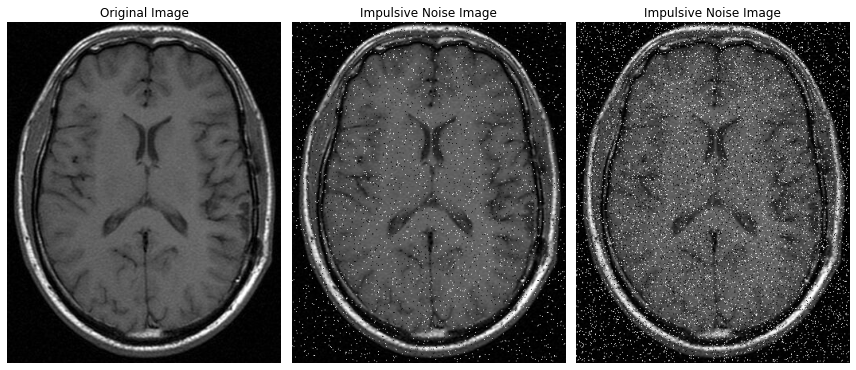

In [4]:
noisy_img_60,type_noise_60 = noise_f('sp',50,img)
noisy_img_150,type_noise_150 = noise_f('sp',150,img)


plot_img((img,noisy_img_60,noisy_img_150),('Original Image','{} Noise Image'.format(type_noise_60),
                                           '{} Noise Image'.format(type_noise_150)),plt.cm.gray)

As we can observe in the above images, the <font style="color: orange"><b>impulsive noise</b></font>, also called salt and pepper, is characterized by sharp disturbances in the image it produces, which are caused by randomly assigned zero and white pixels. 

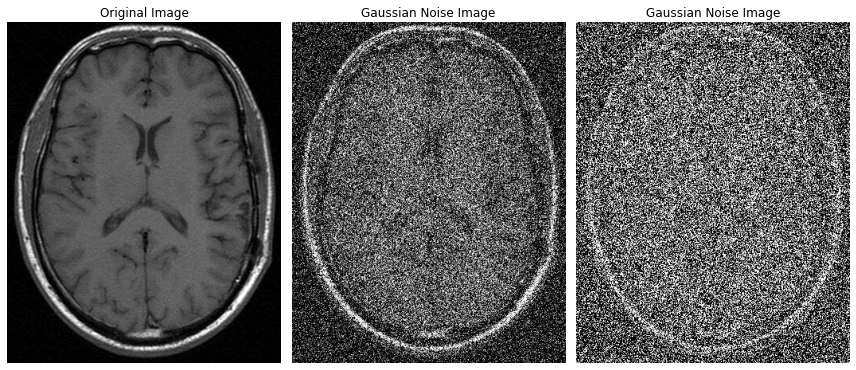

In [5]:
noisy_img_40,type_noise_40 = noise_f('gaussian',40,img)
noisy_img_100,type_noise_100 = noise_f('gaussian',100,img)

plot_img((img,noisy_img_40,noisy_img_100),('Original Image','{} Noise Image'.format(type_noise_40),
                                           '{} Noise Image'.format(type_noise_100)),plt.cm.gray)

The probability density function of the <font style="color: orange"><b>Gaussian noise</b></font> follows a normal distribution. 

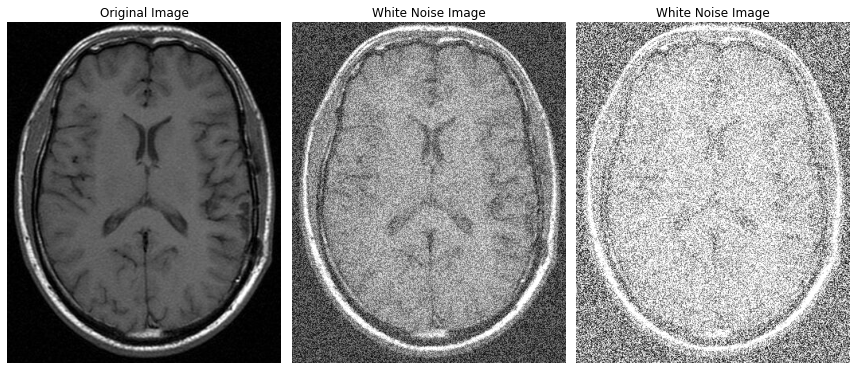

In [6]:
noisy_img_55,type_noise_55 = noise_f('white',55,img)
noisy_img_110,type_noise_110 = noise_f('white',110,img)

plot_img((img,noisy_img_55,noisy_img_110),('Original Image','{} Noise Image'.format(type_noise_55),
                                           '{} Noise Image'.format(type_noise_110)),plt.cm.gray)

<font style="color: orange"><b>White noise</b></font> has a constant power spectral density, i.e. different frequencies have equal intensity. It causes images to be brighter.


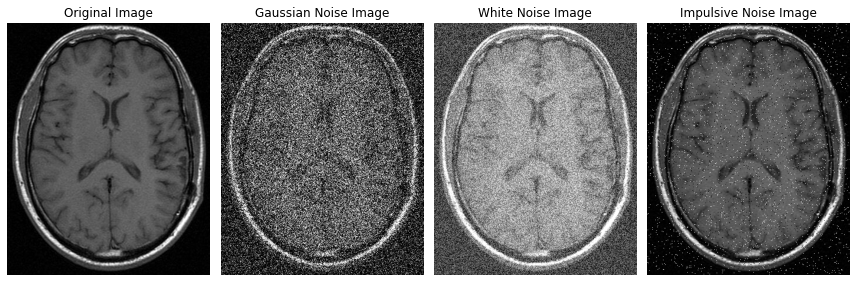

In [7]:
plot_img((img,noisy_img_40,noisy_img_55,noisy_img_60),
         ('Original Image','{} Noise Image'.format(type_noise_40),'{} Noise Image'.format(type_noise_55),
          '{} Noise Image'.format(type_noise_60)),plt.cm.gray)

<center><div class="alert alert-block alert-warning">
Filtering by the Non Local Means method
</div></center>

&nbsp;


The <font style="color: orange"><b>Non-Local Means</b></font> is a smoothing filter whose aim is to improve the results obtained by applying the standard smoothing filters. The NLM produces images with better spatial resolution and better-defined edges. Its algorithm compares the similarity between a patch centered on the pixel to be filtered with all the patches within the image, and does so for all the pixels of the image that we want to filter.

Throughout this section, we will consider and evaluate the performance of three NLM methods:

- **Standard NLM**: The steps of this method are:

    1. Computing the euclidean distance between the patch of the pixel to be filtered and all the other patches within the image
    2. With the euclidean distance, computing the raw weights between our patch and all the other patches
    3. By summing all the raw weights, the normalization constant Z is obtained. It is unique for every pixel we want to filter
    4. Normalizing the raw weights
    5. Finally, computing the filtered-value of the pixel, by multiplying all weights by the pixel belonging to the patch 2 and summing all the obtained values
    

- **NLM with maximum similarity value**: In the standard NLM algorithm, there comes a point in which the pixel to be filtered is compared to itself. The 'maximum' modification assigns to that weight the maximum similarity value obtained for the pixel we are trying to filter.


- **NLM-CPP Modification**: We might want to use the CPP modification when there are pixels very different from their environment, and which might represent a lesion. The standard NLM method would smooth these points excessively so that we would lose -maybe critical- information. The NLM-CPP algorithm modifies the way in which weights are computed, so that the similarity between pixels also depend on the similarity between central pixels.


&nbsp;

<center><b>
Brain (with white noise)
</b></center>

&ensp;

In [8]:
noisy_img = noisy_img_55 # white noise image of the brain

width=1
pad_img = np.pad(noisy_img, (1,1), mode='symmetric')

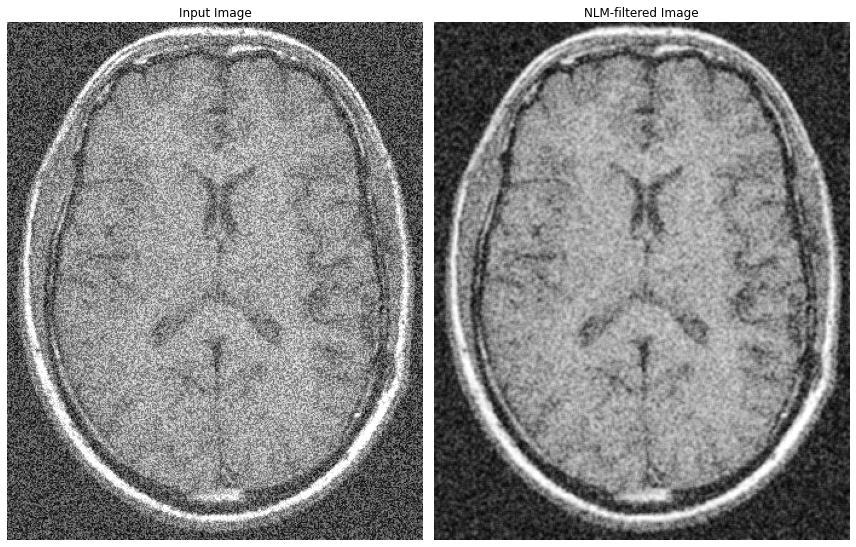

In [9]:
output_img = NLM_method(img, pad_img)

plot_img((noisy_img,output_img),('Input Image','NLM-filtered Image'),plt.cm.gray)


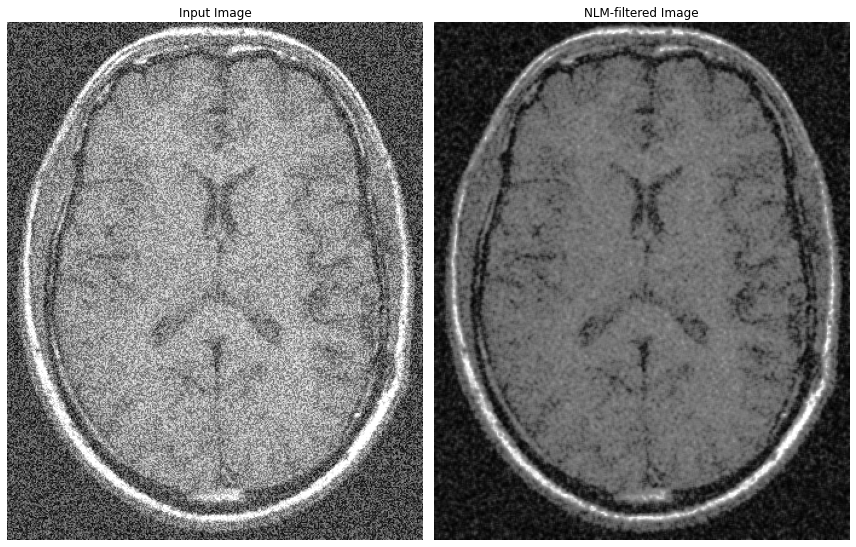

In [10]:
output_img = NLM_method(img, pad_img, h=0.5)

plot_img((noisy_img,output_img),('Input Image','NLM-filtered Image'),plt.cm.gray)

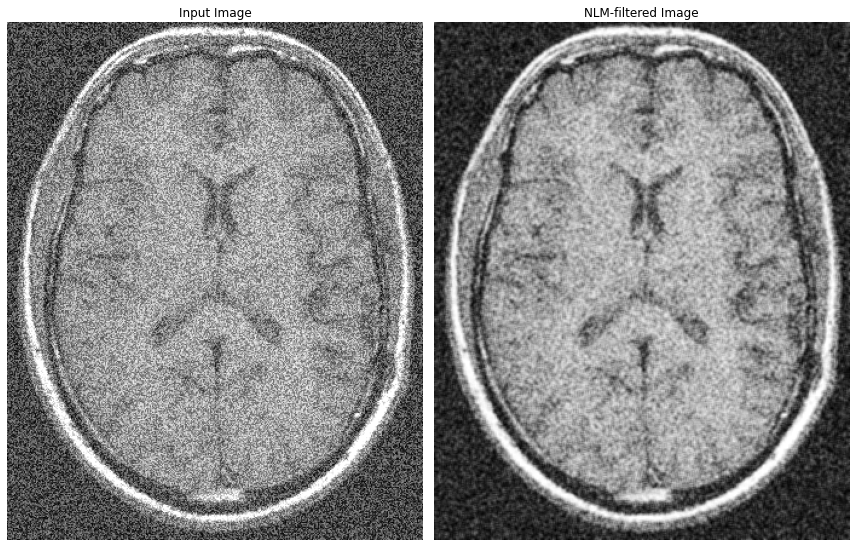

In [11]:
output_img = NLM_method(img, pad_img, h=4)

plot_img((noisy_img,output_img),('Input Image','NLM-filtered Image'),plt.cm.gray)

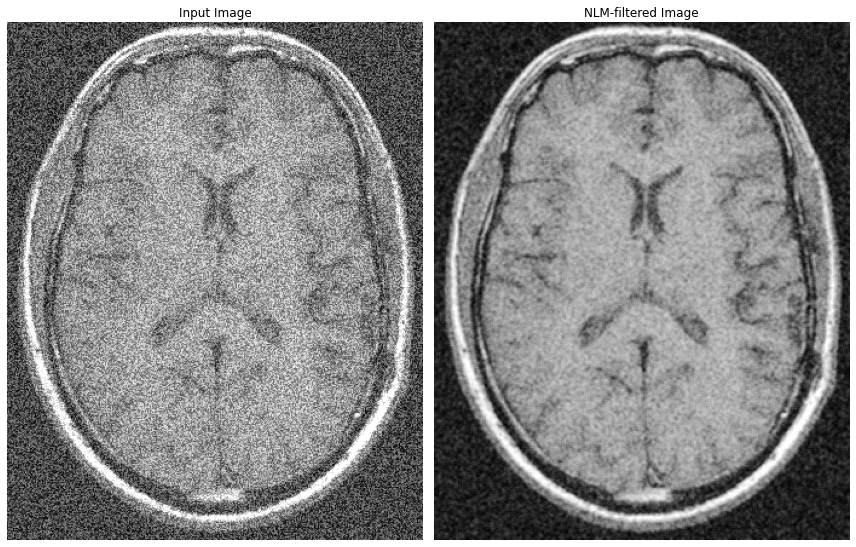

In [12]:
output_img = NLM_method(img, pad_img, mode='cpp', alpha=0.5)

plot_img((noisy_img,output_img),('Input Image','NLM-filtered Image'),plt.cm.gray)

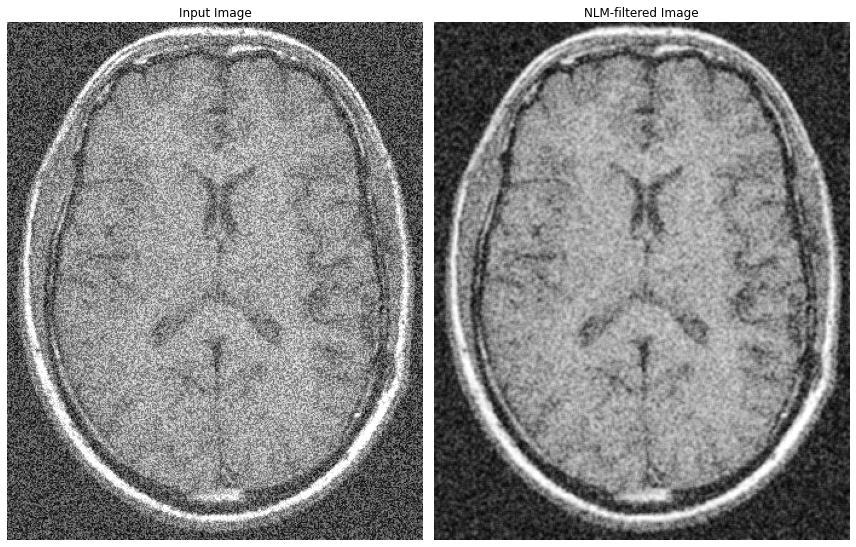

In [13]:
output_img = NLM_method(img, pad_img, mode='maximum')

plot_img((noisy_img,output_img),('Input Image','NLM-filtered Image'),plt.cm.gray)

In [17]:
print('hello')

hello


&nbsp;

<center><b>
Breast with a malignant tumor (with Gaussian noise)
</b></center>

&ensp;

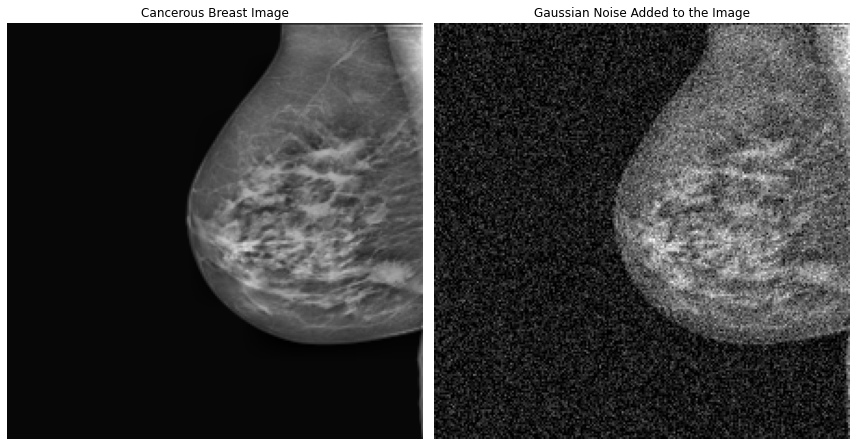

In [14]:
noisy_img,type_noise = noise_f('gaussian',10,img_b)

width=1
pad_img = np.pad(noisy_img, (1,1), mode='symmetric')

plot_img((img_b,noisy_img),('Cancerous Breast Image','{} Noise Added to the Image'.format(type_noise)),'gray')

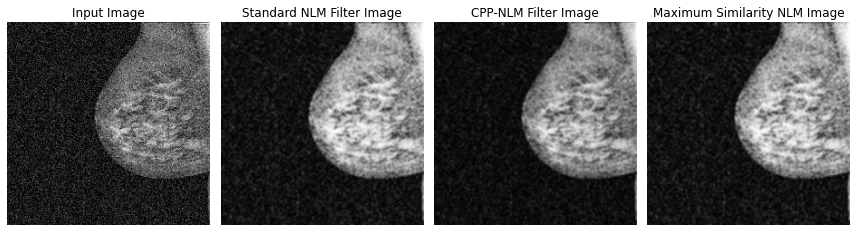

In [15]:
output_img_st = NLM_method(img_b, pad_img)
output_img_cpp = NLM_method(img_b, pad_img, mode='cpp', alpha=1.5)
output_img_max = NLM_method(img_b, pad_img, mode='maximum')

plot_img((noisy_img,output_img_st,output_img_cpp,output_img_max),
         ('Input Image','Standard NLM Filter Image','CPP-NLM Filter Image','Maximum Similarity NLM Image'),'gray')

&nbsp;

<center><b>
Hand fracture (with white noise)
</b></center>

&ensp;

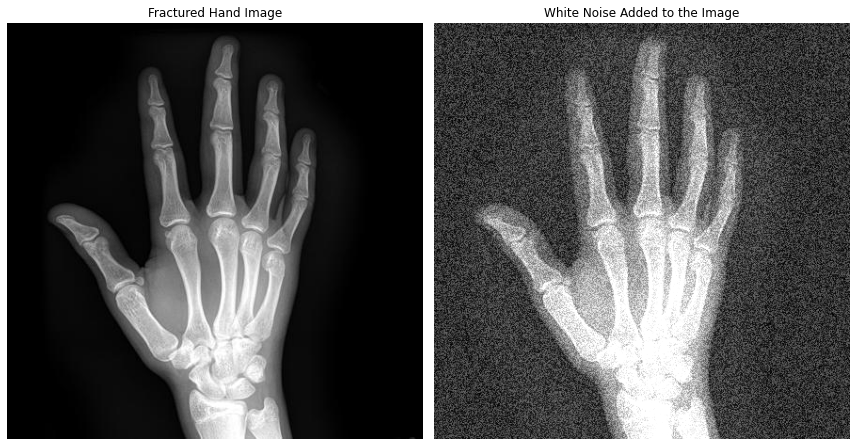

In [16]:
noisy_img,type_noise = noise_f('white',40,img_h)

width=1
pad_img = np.pad(noisy_img, (1,1), mode='symmetric')

plot_img((img_h,noisy_img),('Fractured Hand Image','{} Noise Added to the Image'.format(type_noise)),'gray')

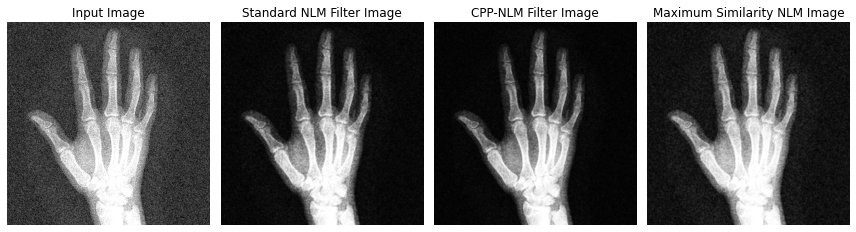

In [17]:
output_img_st = NLM_method(img_h, pad_img)
output_img_cpp = NLM_method(img_h, pad_img, mode='cpp')
output_img_max = NLM_method(img_h, pad_img, h=2, mode='maximum')

plot_img((noisy_img,output_img_st,output_img_cpp,output_img_max),
         ('Input Image','Standard NLM Filter Image','CPP-NLM Filter Image','Maximum Similarity NLM Image'),'gray')

&nbsp;

<center><b>
Cornea (with Gaussian noise)
</b></center>

&ensp;



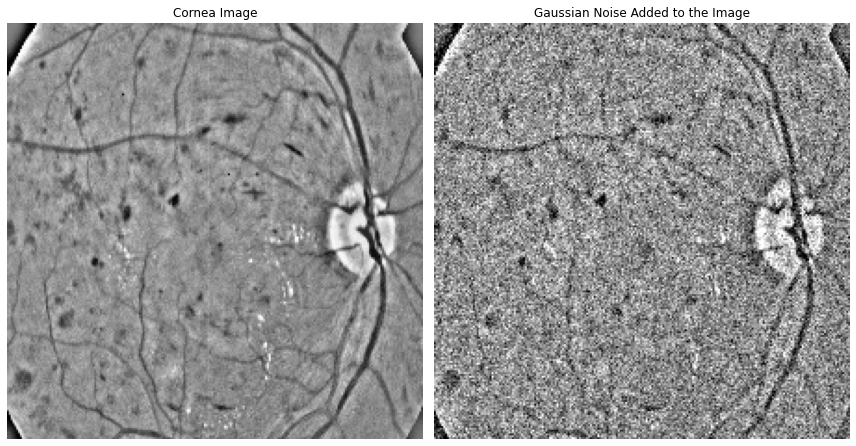

In [18]:
noisy_img,type_noise = noise_f('gaussian',15,img_cornea)

width=1
pad_img = np.pad(noisy_img, (1,1), mode='symmetric')

plot_img((img_cornea,noisy_img),('Cornea Image','{} Noise Added to the Image'.format(type_noise)),'gray')

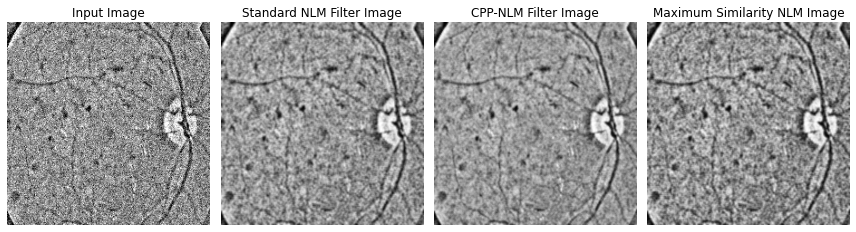

In [19]:
output_img_st = NLM_method(img_cornea, pad_img)
output_img_cpp = NLM_method(img_cornea, pad_img, mode='cpp')
output_img_max = NLM_method(img_cornea, pad_img, h=2, mode='maximum')

plot_img((noisy_img,output_img_st,output_img_cpp,output_img_max),
         ('Input Image','Standard NLM Filter Image','CPP-NLM Filter Image','Maximum Similarity NLM Image'),'gray')

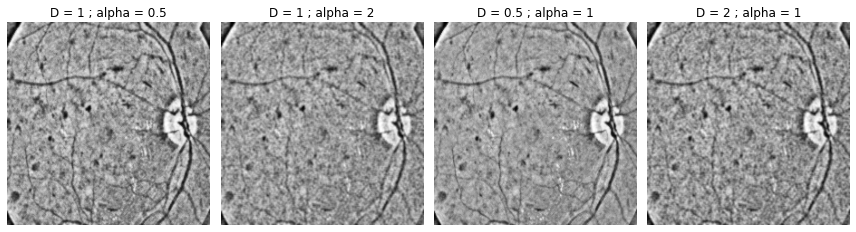

In [20]:
output_img_cpp2 = NLM_method(img_cornea, pad_img, mode='cpp',alpha=0.5)
output_img_cpp3 = NLM_method(img_cornea, pad_img, mode='cpp',alpha=2)
output_img_cpp4 = NLM_method(img_cornea, pad_img, mode='cpp',D=0.5)
output_img_cpp5 = NLM_method(img_cornea, pad_img, mode='cpp',D=2)

plot_img((output_img_cpp2,output_img_cpp3,output_img_cpp4,output_img_cpp5),
         ('D = 1 ; alpha = 0.5','D = 1 ; alpha = 2','D = 0.5 ; alpha = 1','D = 2 ; alpha = 1'),'gray')

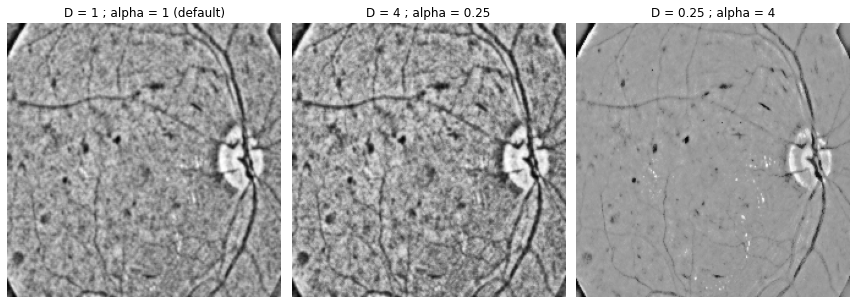

In [21]:
output_img_cpp6 = NLM_method(img_cornea, pad_img, mode='cpp',D=4,alpha=0.25)
output_img_cpp7 = NLM_method(img_cornea, pad_img, mode='cpp',D=0.25,alpha=4)

plot_img((output_img_cpp,output_img_cpp6,output_img_cpp7),
         ('D = 1 ; alpha = 1 (default)','D = 4 ; alpha = 0.25','D = 0.25 ; alpha = 4'),'gray')

&nbsp;

<center><font style="color: orange"><b>Conclusions </b></font></center>

From all the above regions and its corresponding filtered regions, we can draw the following conclusions:

- The higher the h parameter, the brighter the output image will be, and the higher its contrast.
- Higher D and lower alpha parameters, emphasize details in the NLM-CPP method output image; lower D and higher alpha greatly smooth the input image.
- In general, the NLM method that keeps the more detail is the NLM-CPP modification.
- The Maximum Similarity NLM modification brightens the bright areas and darkens the dark ones.

&nbsp;

<center><div class="alert alert-block alert-info">
Contribution of the members
</div></center>

&nbsp;

- **Code, Jupyter and comments**: Amanda and Sara.
- **plot_img**: Amanda and Sara.

&nbsp;
&nbsp;

<center><font style="color: lightblue"><b>Enjoying our project?</b></font></center>
&nbsp;
<center><font style="color: lightblue"><b>Go on to the next Jupyter Notebook!</b></font></center>

&nbsp;